In [1]:
#from google.colab import drive
#drive.mount('/content/drive')

# Catégorisez automatiquement des questions - Stack Overflow

#### Objectif: 
Développement d'un système de suggestion de tags via une API pour facilité la recherche aux utilisateurs sur le site Stack Overflow. Celui-ci prendra la forme d’un algorithme de machine learning qui assignera automatiquement plusieurs tags pertinents à une question.


Dans ce notebook:

- Récupération des données sur le site StackExchange
- Nettoyage du texte
- Vectorisation

### Sommaire

* [Import](#chapter1)
    * [Fichiers](#section_1_1)
    * [Librairies](#section_1_2)    
    * [Nos Données](#section_1_3)

* [Text Cleaning](#chapter2)
    * [Lower case](#section_2_1)
    * [Regex](#section_2_2) 
    * [Remove duplicates](#section_2_3)

* [Preprocess data](#chapter3)
    * [Tokenization](#section_3_1)
    * [Remove stopwords](#section_3_2) 
    * [Lemmatization](#section__3)
    
* [Vectorization](#chapter3)

## Import <a class="anchor" id="chapter1"></a>
### Import des fichiers <a class="anchor" id="section_1_1"></a>

#### Récupération des données sur le site StackExchange

Remarque: On peut charger au maximum 50 000 entrées/ requête SQL
Période: 2020-01-01 à 2022-09-30

#### Code SQL utilisé
SELECT TOP 500000 CreationDate,Title, Body, Tags, Id, Score, ViewCount, FavoriteCount, AnswerCount
FROM Posts 
WHERE PostTypeId = 1 AND ViewCount > 10 AND FavoriteCount > 10
AND Score > 5 AND AnswerCount > 0 AND LEN(Tags) - LEN(REPLACE(Tags, '<','')) >= 5

### Import des librairies <a class="anchor" id="section_1_2"></a>

In [1]:
import os
import warnings
warnings.filterwarnings('ignore')
import IPython.display

import seaborn as sns 
from bs4 import BeautifulSoup

import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import textblob 
from wordcloud import WordCloud

import requests 
import re

from collections import Counter

import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

from nltk.tokenize import WordPunctTokenizer, word_tokenize
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet

from sklearn.feature_extraction.text import CountVectorizer


pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)
pd.set_option('display.max_colwidth', 300)

[nltk_data] Downloading package punkt to /Users/Diana_1/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/Diana_1/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/Diana_1/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /Users/Diana_1/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


#### Récuperation des fichiers de StackExchange

In [2]:
data = pd.read_csv('data.csv')

In [3]:
data.shape

(27977, 9)

In [3]:
data.head(1)

,CreationDate,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount
0,2008-07-31 21:42:52,How to convert Decimal to Double in C#?,"<p>I want to assign the decimal variable &quot;trans&quot; to the double variable &quot;this.Opacity&quot;.</p>\n<pre class=""lang-cs prettyprint-override""><code>decimal trans = trackBar1.Value / 5000;\nthis.Opacity = trans;\n</code></pre>\n<p>When I build the app it gives the following error:</p...",<c#><floating-point><type-conversion><double><decimal>,4,783,68560,60,14


In [4]:
data.describe()

,Id,Score,ViewCount,FavoriteCount,AnswerCount
count,2.797700e+04,27977.000000,2.797700e+04,27977.000000,27977.000000
mean,1.691495e+07,114.639347,1.131413e+05,42.764414,7.178754
std,1.542698e+07,352.902564,2.490073e+05,145.678073,6.818255
min,4.000000e+00,6.000000,2.790000e+02,11.000000,1.000000
25%,4.206612e+06,29.000000,2.198500e+04,14.000000,3.000000
50%,1.213552e+07,52.000000,4.940800e+04,19.000000,5.000000
75%,2.619177e+07,100.000000,1.132510e+05,35.000000,9.000000
max,7.290447e+07,26702.000000,1.040678e+07,11656.000000,130.000000


In [5]:
data["Tags"].value_counts(ascending=False).loc[lambda x : x>100]

Series([], Name: Tags, dtype: int64)

In [6]:
data["Tags"].value_counts().to_frame()

,Tags
<java><spring><jpa><spring-data><spring-data-jpa>,19
<python><apache-spark><dataframe><pyspark><apache-spark-sql>,16
<javascript><jquery><html><css><twitter-bootstrap>,12
<python><tensorflow><machine-learning><keras><deep-learning>,9
<python><image><opencv><image-processing><computer-vision>,9
<java><spring><hibernate><jpa><spring-data-jpa>,7
<linux><bash><shell><unix><scripting>,7
<python><pandas><matplotlib><seaborn><bar-chart>,6
<java><spring><mongodb><spring-data><spring-data-mongodb>,6
<java><unit-testing><junit><mocking><mockito>,6


In [9]:
data["Tags"].nunique()

27489

## Text Cleaning <a class="anchor" id="chapter2"></a>

In [5]:
data.duplicated().sum()

0

In [7]:
data['CreationDate'] = pd.to_datetime(data['CreationDate'])

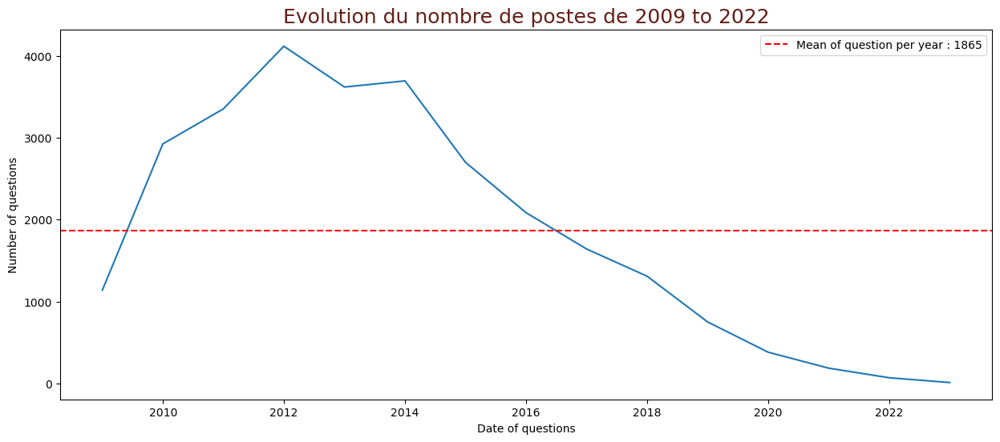

In [8]:
# On regroupe les données en annuel
year = data.groupby(pd.Grouper(key='CreationDate',
                                    freq='1Y')).agg({'Title': 'count'})

# Evolution au fur et a mesure des années
fig = plt.figure(figsize=(15,6))
sns.lineplot(data=year, x=year.index, y='Title')
plt.axhline(year.Title.mean(), 
            color="r", linestyle='--',
            label="Mean of question per year : {:04d}"\
                   .format(int(year.Title.mean())))
plt.xlabel("Date of questions")
plt.ylabel("Number of questions")
plt.title("Evolution du nombre de postes de 2009 to 2022",
          fontsize=18, color="#641E16")
plt.legend()
plt.savefig("Evolution du nombre de postes",transparent=True)
plt.show()

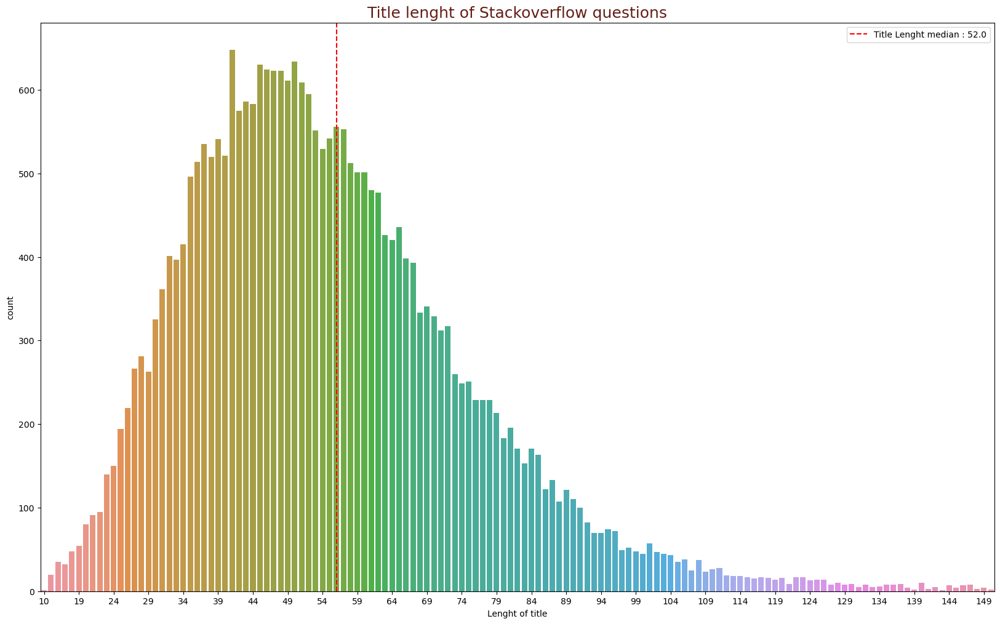

In [9]:
# Longeur des titres

fig = plt.figure(figsize=(20, 12))
ax = sns.countplot(x=data.Title.str.len())
start, end = ax.get_xlim()
ax.xaxis.set_ticks(np.arange(0, end, 5))
plt.axvline(data.Title.str.len().median() - data.Title.str.len().min(),
            color="r", linestyle='--',
            label="Title Lenght median : "+str(data.Title.str.len().median()))
ax.set_xlabel("Lenght of title")
plt.title("Title lenght of Stackoverflow questions",
          fontsize=18, color="#641E16")
plt.legend()
plt.show()

In [10]:
# Discretizer for Body characters lenght
X = pd.DataFrame(data.Body.str.len())

# Sklearn discretizer with 200 bins
from sklearn.preprocessing import KBinsDiscretizer
discretizer = KBinsDiscretizer(n_bins=200,
                               encode='ordinal',
                               strategy='uniform')
body_lenght = discretizer.fit_transform(X)
body_lenght = discretizer.inverse_transform(body_lenght)
body_lenght = pd.Series(body_lenght.reshape(-1))


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


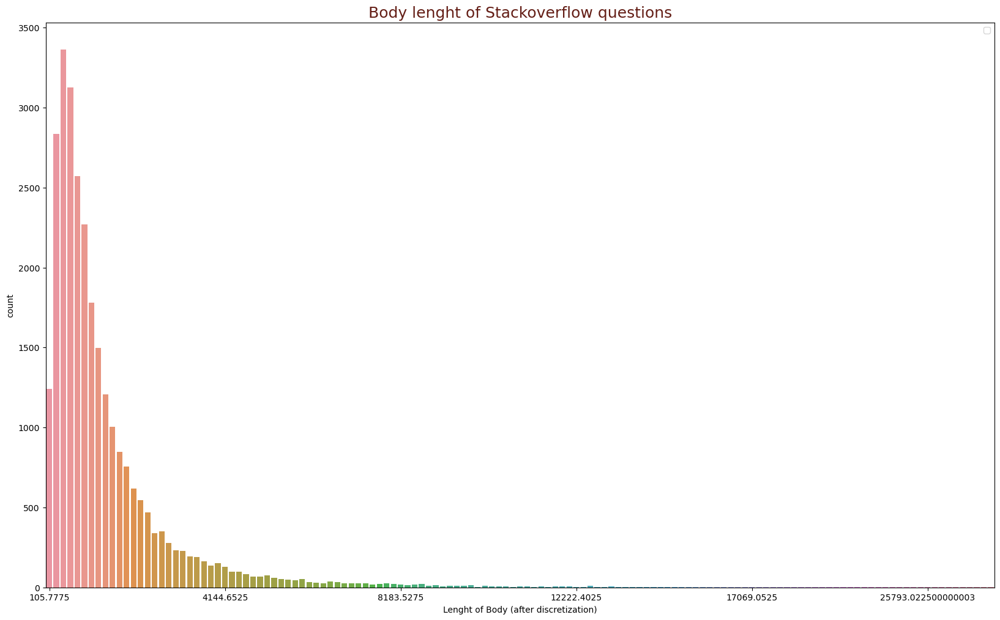

In [11]:
fig = plt.figure(figsize=(20, 12))
ax = sns.countplot(x=body_lenght)
start, end = ax.get_xlim()
ax.xaxis.set_ticks(np.arange(0, end, 25))
ax.set_xlabel("Lenght of Body (after discretization)")
plt.title("Body lenght of Stackoverflow questions",
          fontsize=18, color="#641E16")
plt.legend()
plt.show()

In [12]:
# Nous allons d'abord concatener le body et le titre

data['Text'] = data['Title'] + data['Body']
#data = data.drop(['Title','Body'], axis=1)
data.head(1)

,CreationDate,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount,Text
0,2008-07-31 21:42:52,How to convert Decimal to Double in C#?,"<p>I want to assign the decimal variable &quot;trans&quot; to the double variable &quot;this.Opacity&quot;.</p>\n<pre class=""lang-cs prettyprint-override""><code>decimal trans = trackBar1.Value / 5000;\nthis.Opacity = trans;\n</code></pre>\n<p>When I build the app it gives the following error:</p...",<c#><floating-point><type-conversion><double><decimal>,4,783,68560,60,14,"How to convert Decimal to Double in C#?<p>I want to assign the decimal variable &quot;trans&quot; to the double variable &quot;this.Opacity&quot;.</p>\n<pre class=""lang-cs prettyprint-override""><code>decimal trans = trackBar1.Value / 5000;\nthis.Opacity = trans;\n</code></pre>\n<p>When I build t..."


In [13]:
# Count words
def word_count_func(text):
    return len(text.split())

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


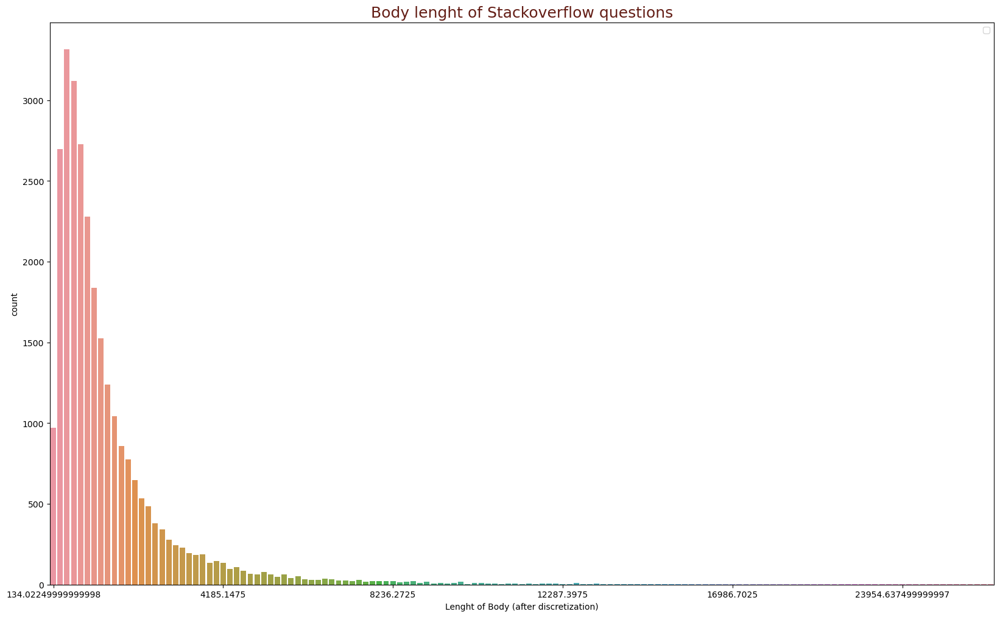

In [14]:
# Discretizer for Body characters lenght
X = pd.DataFrame(data.Text.str.len())

# Sklearn discretizer with 200 bins
from sklearn.preprocessing import KBinsDiscretizer
discretizer = KBinsDiscretizer(n_bins=200,
                               encode='ordinal',
                               strategy='uniform')
body_lenght = discretizer.fit_transform(X)
body_lenght = discretizer.inverse_transform(body_lenght)
body_lenght = pd.Series(body_lenght.reshape(-1))

fig = plt.figure(figsize=(20, 12))
ax = sns.countplot(x=body_lenght)
start, end = ax.get_xlim()
ax.xaxis.set_ticks(np.arange(0, end, 25))
ax.set_xlabel("Lenght of Body (after discretization)")
plt.title("Body lenght of Stackoverflow questions",
          fontsize=18, color="#641E16")
plt.legend()
plt.show()

## Nettoyage du texte

### Lower Case <a class="anchor" id="section_2_1"></a>

In [15]:
data['Text_lower']= data['Text'].apply(lambda x: x.lower())

In [16]:
# Function to remove code
def remove_code(html):
  
    # parse html content
    soup = BeautifulSoup(html, "html.parser")
  
    for data in soup(['style', 'script']):
        # Remove tags
        data.decompose()
  
    # return data by retrieving the tag content
    return ' '.join(soup.stripped_strings)

In [17]:
data['Text_BeautifulSoup']=data['Text_lower'].apply(remove_code)

In [21]:
data.head(1)

,CreationDate,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount,Text,Text_lower,Text_BeautifulSoup
0,2008-07-31 21:42:52,How to convert Decimal to Double in C#?,"<p>I want to assign the decimal variable &quot;trans&quot; to the double variable &quot;this.Opacity&quot;.</p>\n<pre class=""lang-cs prettyprint-override""><code>decimal trans = trackBar1.Value / 5000;\nthis.Opacity = trans;\n</code></pre>\n<p>When I build the app it gives the following error:</p...",<c#><floating-point><type-conversion><double><decimal>,4,783,68560,60,14,"How to convert Decimal to Double in C#?<p>I want to assign the decimal variable &quot;trans&quot; to the double variable &quot;this.Opacity&quot;.</p>\n<pre class=""lang-cs prettyprint-override""><code>decimal trans = trackBar1.Value / 5000;\nthis.Opacity = trans;\n</code></pre>\n<p>When I build t...","how to convert decimal to double in c#?<p>i want to assign the decimal variable &quot;trans&quot; to the double variable &quot;this.opacity&quot;.</p>\n<pre class=""lang-cs prettyprint-override""><code>decimal trans = trackbar1.value / 5000;\nthis.opacity = trans;\n</code></pre>\n<p>when i build t...","how to convert decimal to double in c#? i want to assign the decimal variable ""trans"" to the double variable ""this.opacity"". decimal trans = trackbar1.value / 5000;\nthis.opacity = trans; when i build the app it gives the following error: cannot implicitly convert type decimal to double"


### Regex <a class="anchor" id="section_2_2"></a>

In [18]:
# Substitution de hashtags, '@', html, ponctuation
def regex(text):
    
    # Remove html tags
    text=re.sub(r"<[^>]*>",' ', str(text))
    # Remove usernames "@"
    text=re.sub(r'@\S+', ' ', text)
    # Remove hashtags
    text=re.sub(r'#\S+', ' ', text)
    # Remove punctuation
    text=re.sub(r'[^\w\s]', ' ', text)
    # Remove unicode characters
    text = text.encode("ascii", "ignore").decode()
    # Remove English contractions
    text = re.sub("\'\w+", '', text)
    # Remove extra spaces
    text = re.sub('\s+', ' ', text)
    # Remove numbers
    text = re.sub(r'\w*\d+\w*', '', text)
    # Remove links
    text = re.sub(r'http*\S+', '', text)
    # Remove punctuation
    text = re.sub(r'[^a-zA-Z0-9]', ' ', text)
    # Remove irrelevant characters
    text = re.sub(r'[^a-zA-Z]', ' ', text)
    # Remove whitespace
    text=re.sub(r'^\s*|\s\s*', ' ', text).strip()
    text=text.replace('\n', ' ')

    return text

In [19]:
data['Text_regex'] = data['Text_BeautifulSoup'].apply(regex)

In [20]:
data['Text_regex'][13690]

'how to resize images in org mode is there a general way to define the size in percent or pixels for an image that is linked in org mode say i have the following link in my org file images example jpg this jpg is way too large so if i export it to html or latex or open it in org mode with c c c o i will only see a fraction of the image'

### Remove duplicates <a class="anchor" id="section_2_3"></a>

In [21]:
from collections import Counter
 
def remov_duplicates(input):
 
    # split input string separated by space
    input = input.split(" ")
 
    # now create dictionary using counter method
    # which will have strings as key and their
    # frequencies as value
    UniqW = Counter(input)
 
    # joins two adjacent elements in iterable way
    s = " ".join(UniqW.keys())
    
    return s

In [22]:
data['Text_remove_duplicate']=data['Text_regex'] .apply(remov_duplicates)

In [23]:
data['Text_remove_duplicate'][5218]

'error xxx already defined in msvcrt lib dll c something libcmt setlocal obj i m using dcmtk library for reading dicom files image format used medical processing having a problem compiling this source code uses some additional external libraries zlib tiff libpng libiconv know that all should be generated with same generation options ve downloaded the compiled versions of these support which are multithreaded runtime md each project ensured but still getting errors iob func src cmakebinaries dcmpstat apps file lock unlock initterm e exit cexit amsg fflush errno dosmap invoke watson invarg void cdecl terminate hooks xi cinitexe z xc mlock xcptfilter winxfltr maincrtstartup crtexe set app type errmode configthreadlocale getenv isctype strnicmp close fileno calloc atol atox strcspn stricmp atoi lseek read write open get osfhandle osfinfo one or more multiply symbols found release exe dcmprscp dcmprscu dcmpsprt dcmsr edit observations there conflicts only between two doesn t exist at locati

In [24]:
data['Text_regex'][5218]

'error xxx already defined in msvcrt lib dll c something libcmt lib setlocal obj i m using dcmtk library for reading dicom files image format used in medical image processing i m having a problem in compiling this dcmtk source code dcmtk uses some additional external libraries zlib tiff libpng libiconv i know that all libraries should be generated with same code generation options i ve downloaded the compiled versions of these support libraries which are compiled with multithreaded dll runtime options md in each project of dcmtk source code i ensured that runtime options are multithreaded dll md but still i m getting these errors error error iob func already defined in msvcrt lib dll c dcmtk src cmakebinaries dcmpstat apps libcmt lib file obj error error lock file already defined in msvcrt lib dll c dcmtk src cmakebinaries dcmpstat apps libcmt lib file obj error error unlock file already defined in msvcrt lib dll c dcmtk src cmakebinaries dcmpstat apps libcmt lib file obj error error i

In [25]:
#def tag_clean(text):
 #   text=text.replace('<','')
  #  text=text.replace('>','')
    
   # return text


## Preprocessing <a class="anchor" id="chapter3"></a>
### Spelling correction <a class="anchor" id="section_3_1"></a>

Nous supposons que dans le forum,blog il y a souvent les erreurs de frappe ou 

In [27]:
pip install -U textblob

Note: you may need to restart the kernel to use updated packages.


In [28]:
from textblob import TextBlob

In [29]:
def corr(text):

  text=TextBlob(text).correct()

  return text

### Tokenization <a class="anchor" id="section_3_2"></a>

In [25]:
data['Text_tokenized']=data['Text_remove_duplicate'].apply(word_tokenize)

### Stopwords <a class="anchor" id="section_3_3"></a>

In [26]:
#def remove_english_stopwords_func(text):
    '''
    Removes Stop Words (also capitalized) from a string, if present
    Args:
        text (str): String to which the function is to be applied, string 
    Returns:
        Clean string without Stop Words
    ''' 
    # check in lowercase 
 #   t = [token for token in text if token.lower() not in stopwords.words("english")]
  #  text = ' '.join(t)    
   # return text

IndentationError: unexpected indent (1448659870.py, line 2)

In [27]:
stopwords = set(stopwords.words('english'))
data['Text_stopwords'] = data['Text_tokenized'].apply(lambda text: [token for token in text if token not in stopwords])

### Lemmatization <a class="anchor" id="section_3_4"></a>

In [28]:
def get_pos_tags(word):
    
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ, #adjective
                "N": wordnet.NOUN,#noun
                "V": wordnet.VERB,#verb
                "R": wordnet.ADV} #adverb

    return tag_dict.get(tag, wordnet.NOUN)

def lemma_fct(list_words) :
    lemmatizer = WordNetLemmatizer()
    lem_w = [lemmatizer.lemmatize(w, get_pos_tags(w)) for w in list_words]
    return lem_w

In [29]:
data['Text_lemmatized']=data['Text_stopwords'].apply(lemma_fct)

### Remove single character

In [30]:
def remove_single_char_func(text, threshold=1):
    threshold = threshold
    words = word_tokenize(text)
    text = ' '.join([w for w in words if len(w) > threshold])
    return text

In [31]:
data['Cleaned_text'] = data['Text_lemmatized'].apply(lambda x: ' '.join(x))

In [32]:
data['Cleaned_text']= data['Cleaned_text'].apply(remove_single_char_func)

In [33]:
data['length_cleaned_text'] = data['Cleaned_text'].apply(lambda x : len(word_tokenize(str(x))))
max_length_cleaned_data = data['length_cleaned_text'].max()
print("max length Cleaned_text : ", max_length_cleaned_data)

max length Cleaned_text :  738


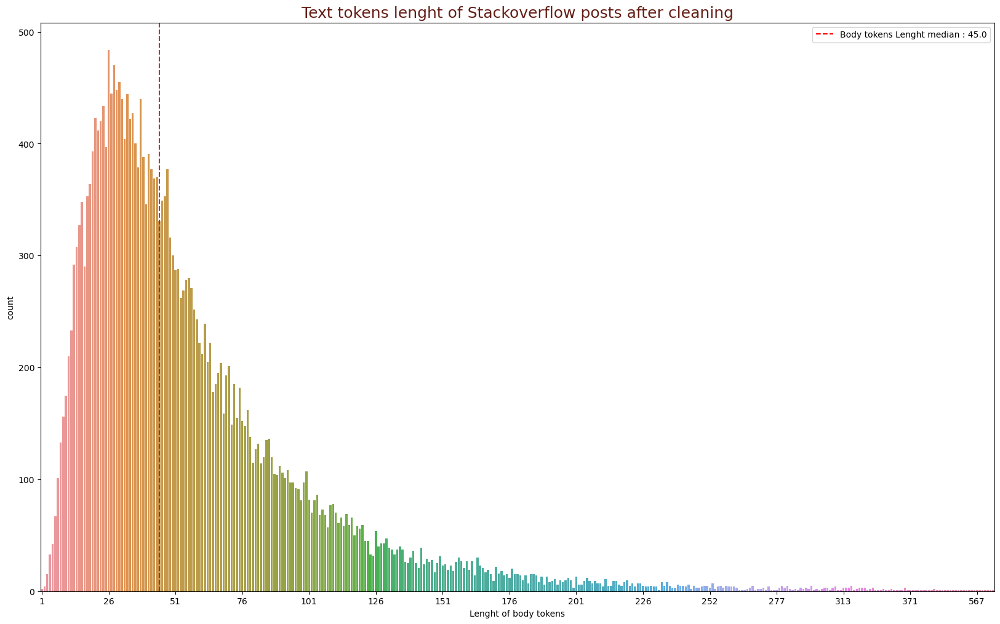

In [34]:
# Calculate lenght of each list in Body
#data['body_tokens_count'] = [len(_) for _ in data.Cleaned_text]
data['body_tokens_count'] = data['length_cleaned_text'] 
# Countplot of body lenght
fig = plt.figure(figsize=(20, 12))
ax = sns.countplot(x=data.body_tokens_count)
start, end = ax.get_xlim()
ax.xaxis.set_ticks(np.arange(0, end, 25))
plot_median = data.body_tokens_count.median()
plt.axvline(plot_median - data.body_tokens_count.min(),
            color="r", linestyle='--',
            label="Body tokens Lenght median : "+str(plot_median))
ax.set_xlabel("Lenght of body tokens")
plt.title("Text tokens lenght of Stackoverflow posts after cleaning",
          fontsize=18, color="#641E16")
plt.legend()
plt.savefig("Text tokens lenght of Stackoverflow posts after cleanin",transparent=True)
plt.show()

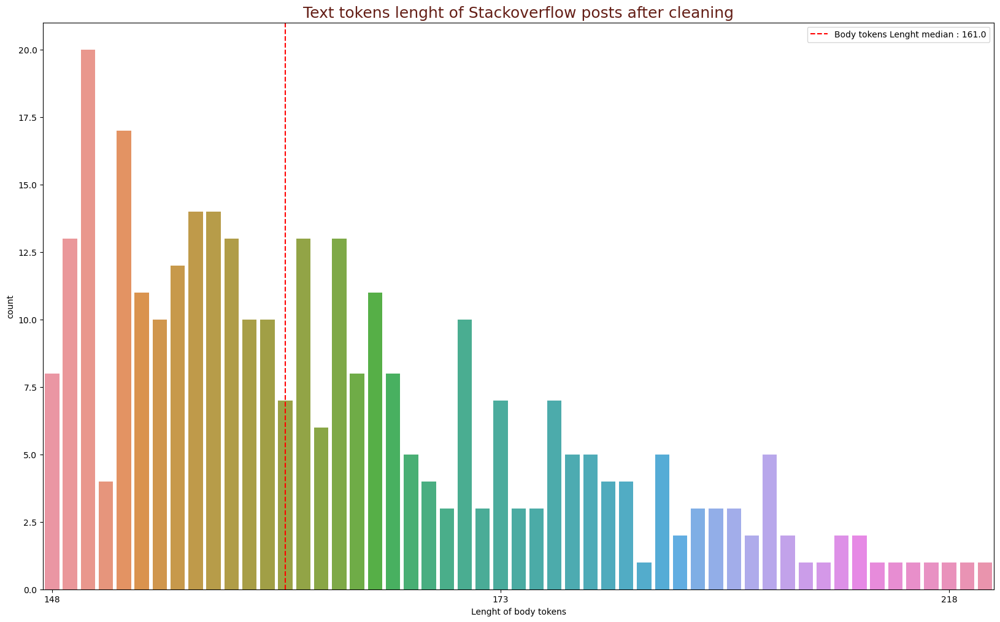

In [47]:
# Calculate lenght of each list in Body
#data['body_tokens_count'] = [len(_) for _ in data.Cleaned_text]
data['body_tokens_count'] = data['length_cleaned_text'] 
# Countplot of body lenght
fig = plt.figure(figsize=(20, 12))
ax = sns.countplot(x=data.body_tokens_count)
start, end = ax.get_xlim()
ax.xaxis.set_ticks(np.arange(0, end, 25))
plot_median = data.body_tokens_count.median()
plt.axvline(plot_median - data.body_tokens_count.min(),
            color="r", linestyle='--',
            label="Body tokens Lenght median : "+str(plot_median))
ax.set_xlabel("Lenght of body tokens")
plt.title("Text tokens lenght of Stackoverflow posts after cleaning",
          fontsize=18, color="#641E16")
plt.legend()
plt.savefig("Text tokens lenght of Stackoverflow posts after cleaning text",transparent=True)
plt.show()

In [35]:
data.body_tokens_count.median()

45.0

In [36]:
data.body_tokens_count.quantile([0.25,0.5,0.75])

0.25    28.0
0.50    45.0
0.75    73.0
Name: body_tokens_count, dtype: float64

In [37]:
data.body_tokens_count.quantile(0.95)

147.0

In [38]:
data.body_tokens_count.max()

738

In [39]:
data.shape

(27977, 20)

In [41]:
data[data.body_tokens_count > data.body_tokens_count.quantile(0.95)].shape


(1381, 20)

In [39]:
# Filter data on body lenght
data = data[data.Body.str.len() < 4000]
data.shape

(324, 20)

In [40]:
data.head(1)

,CreationDate,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount,Text,Text_lower,Text_BeautifulSoup,Text_regex,Text_remove_duplicate,Text_tokenized,Text_stopwords,Text_lemmatized,Cleaned_text,length_cleaned_text,body_tokens_count
45,2008-08-12 14:37:28,Can I get Memcached running on a Windows (x64) 64bit environment?,"<p>Does anyone know <strong>IF</strong>, <strong>WHEN</strong> or <strong>HOW</strong> I can get <a href=""https://memcached.org/"" rel=""noreferrer"">Memcached</a> running on a Windows 64bit environment? </p>\n\n<p>I'm setting up a new hosting solution and would much prefer to run a 64bit OS, and s...",<c#><c++><windows><64-bit><memcached>,8896,90,60290,58,11,"Can I get Memcached running on a Windows (x64) 64bit environment?<p>Does anyone know <strong>IF</strong>, <strong>WHEN</strong> or <strong>HOW</strong> I can get <a href=""https://memcached.org/"" rel=""noreferrer"">Memcached</a> running on a Windows 64bit environment? </p>\n\n<p>I'm setting up a ne...","can i get memcached running on a windows (x64) 64bit environment?<p>does anyone know <strong>if</strong>, <strong>when</strong> or <strong>how</strong> i can get <a href=""https://memcached.org/"" rel=""noreferrer"">memcached</a> running on a windows 64bit environment? </p>\n\n<p>i'm setting up a ne...","can i get memcached running on a windows (x64) 64bit environment? does anyone know if , when or how i can get memcached running on a windows 64bit environment? i'm setting up a new hosting solution and would much prefer to run a 64bit os, and since it's an asp.net mvc solution with sql server db...",can i get memcached running on a windows environment does anyone know if when or how i can get memcached running on a windows environment i m setting up a new hosting solution and would much prefer to run a os and since it s an asp net mvc solution with sql server db the os is either going to be...,can i get memcached running on a windows environment does anyone know if when or how m setting up new hosting solution and would much prefer to run os since it s an asp net mvc with sql server db the is either going be hopefully that this could spill over into debate regarding vs servers but let...,"[can, i, get, memcached, running, on, a, windows, environment, does, anyone, know, if, when, or, how, m, setting, up, new, hosting, solution, and, would, much, prefer, to, run, os, since, it, s, an, asp, net, mvc, with, sql, server, db, the, is, either, going, be, hopefully, that, this, could, s...","[get, memcached, running, windows, environment, anyone, know, setting, new, hosting, solution, would, much, prefer, run, os, since, asp, net, mvc, sql, server, db, either, going, hopefully, could, spill, debate, regarding, vs, servers, let, say, preference, good, reasons, far, tried, number, opt...","[get, memcached, run, window, environment, anyone, know, set, new, host, solution, would, much, prefer, run, o, since, asp, net, mvc, sql, server, db, either, go, hopefully, could, spill, debate, regard, v, server, let, say, preference, good, reason, far, try, number, option, found, bit, help, r...",get memcached run window environment anyone know set new host solution would much prefer run since asp net mvc sql server db either go hopefully could spill debate regard server let say preference good reason far try number option found bit help related get machine succeed might add original por...,194,194


In [42]:
data['Cleaned_text'] = data['Cleaned_text'].astype("string")

In [42]:
data['Cleaned_text'].dtype

string[python]

### Les tags

In [43]:
data["Tags"].nunique()

27489

In [44]:
data["Tags"].value_counts()

<java><spring><jpa><spring-data><spring-data-jpa>                                                                         19
<python><apache-spark><dataframe><pyspark><apache-spark-sql>                                                              16
<javascript><jquery><html><css><twitter-bootstrap>                                                                        12
<python><tensorflow><machine-learning><keras><deep-learning>                                                               9
<python><image><opencv><image-processing><computer-vision>                                                                 9
<java><spring><hibernate><jpa><spring-data-jpa>                                                                            7
<linux><bash><shell><unix><scripting>                                                                                      7
<python><pandas><matplotlib><seaborn><bar-chart>                                                                           6


In [45]:
# Replace open and close balise between tags
data['Tags'] = data['Tags'].str.translate(str.maketrans({'<': '', '>': ','}))

# Delete last "," for each row
data['Tags'] = data['Tags'].str[:-1]
data['Tags'].head(3)

0    c#,floating-point,type-conversion,double,decimal
1        c#,datetime,time,datediff,relative-time-span
2    html,browser,timezone,user-agent,timezone-offset
Name: Tags, dtype: object

In [46]:
def count_split_tags(df, column, separator):
    """This function allows you to split the different words contained
    in a Pandas Series cell and to inject them separately into a list.
    This makes it possible, for example, to count the occurrences of words.

    Parameters
    ----------------------------------------
    df : Pandas Dataframe
        Dataframe to use.
    column : string
        Column of the dataframe to use
    separator : string
        Separator character for str.split.
    ----------------------------------------
    """
    list_words = []
    for word in df[column].str.split(separator):
        list_words.extend(word)
    df_list_words = pd.DataFrame(list_words, columns=["Tag"])
    df_list_words = df_list_words.groupby("Tag")\
        .agg(tag_count=pd.NamedAgg(column="Tag", aggfunc="count"))
    df_list_words.sort_values("tag_count", ascending=False, inplace=True)
    return df_list_words

In [47]:
tags_list = count_split_tags(df=data, column='Tags', separator=',')
print("Le jeu de données compte {} tags.".format(tags_list.shape[0]))

Le jeu de données compte 12591 tags.


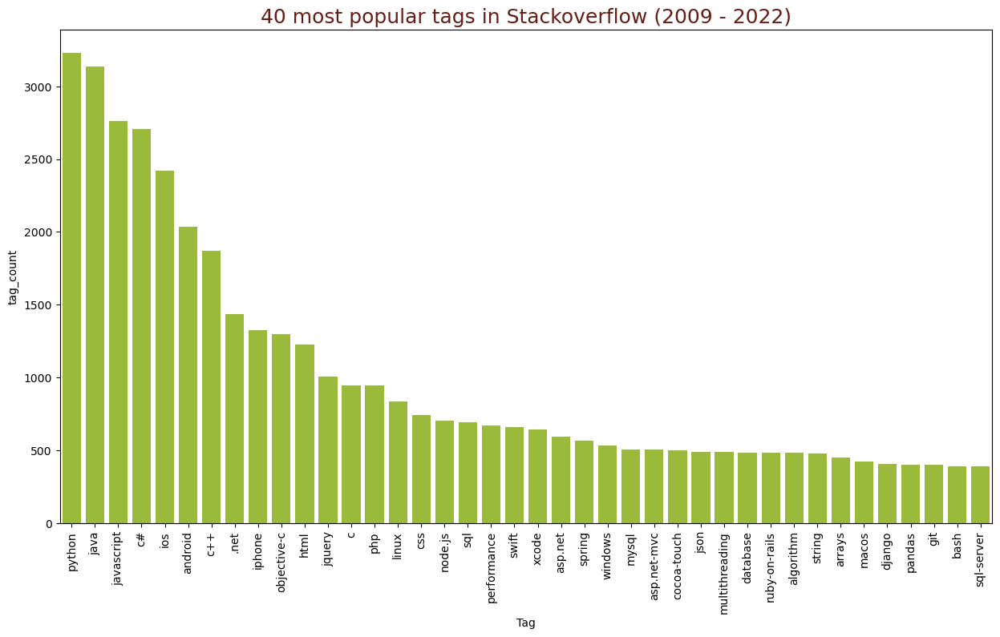

In [48]:
# Plot the results of splits
fig = plt.figure(figsize=(15, 8))
sns.barplot(data=tags_list.iloc[0:40, :],
            x=tags_list.iloc[0:40, :].index,
            y="tag_count", color="#a5cf27")
plt.xticks(rotation=90)
plt.title("40 most popular tags in Stackoverflow (2009 - 2022)",
          fontsize=18, color="#641E16")
plt.show()

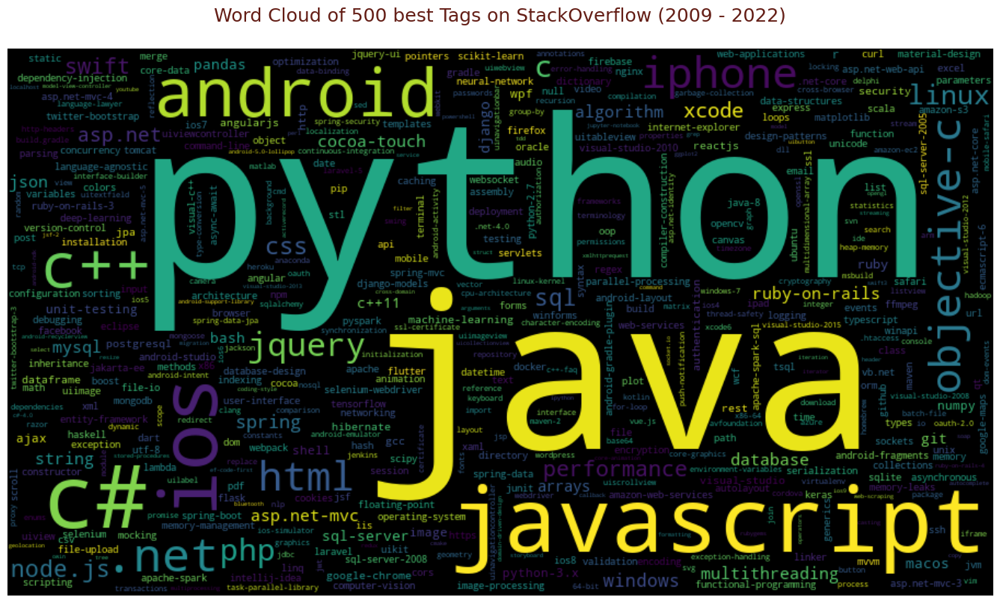

In [49]:
# Plot word cloud with tags_list (frequencies)
fig = plt.figure(1, figsize=(17, 12))
ax = fig.add_subplot(1, 1, 1)
wordcloud = WordCloud(width=900, height=500,
                      background_color="black",
                      max_words=500, relative_scaling=1,
                      normalize_plurals=False)\
    .generate_from_frequencies(tags_list.to_dict()['tag_count'])

ax.imshow(wordcloud, interpolation='bilinear')
ax.axis("off")
plt.title("Word Cloud of 500 best Tags on StackOverflow (2009 - 2022)\n",
          fontsize=18, color="#641E16")
plt.show()

Il est intéressant de voir si les tags populaires ont évolué au cours du temps.

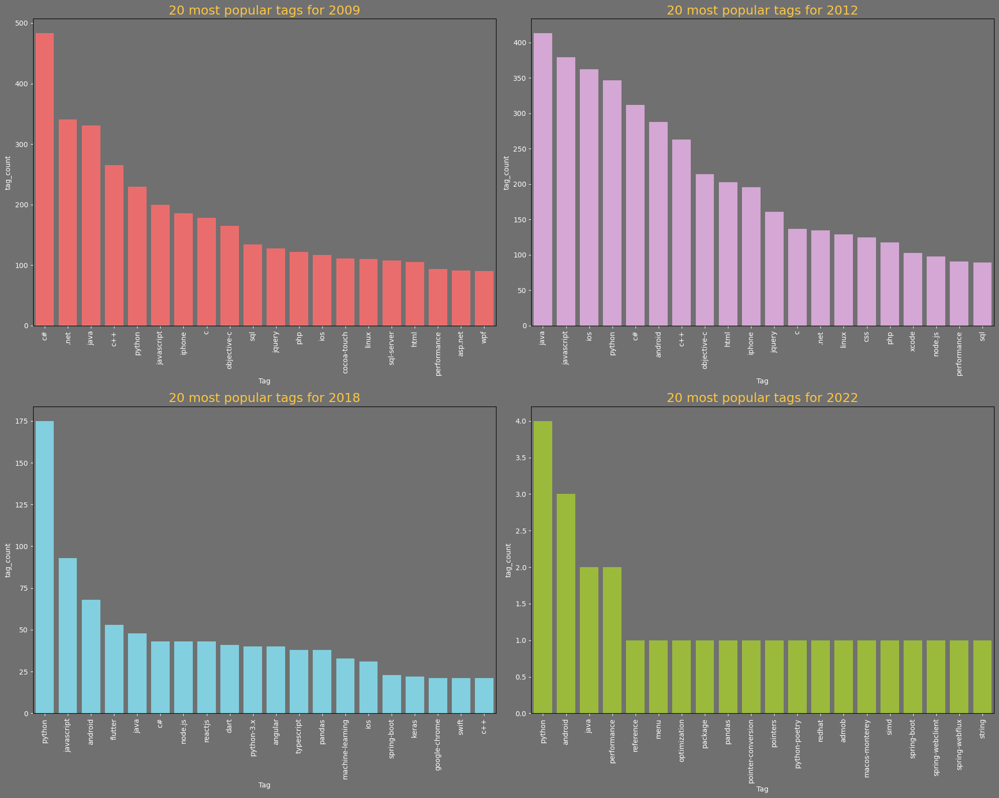

In [50]:
# Subplots parameters
years = {0: 2009, 1: 2012, 2: 2018, 3: 2022}
colors = {0: "#ff5858", 1: "#dba0db",
          2: "#72d9f0", 3: "#a5cf27"}
subplots = 4
cols = 2
rows = subplots // cols
rows += subplots % cols
position = range(1, subplots + 1)

# Plot popular tags for each year
fig = plt.figure(1, figsize=(20, 16))
fig.patch.set_facecolor("#707070")

for k in range(subplots):
    subset = data[data["CreationDate"].dt.year == years[k]]
    temp_list = count_split_tags(df=subset, column='Tags', separator=',')
    ax = fig.add_subplot(rows, cols, position[k])
    sns.barplot(data=temp_list.iloc[0:20, :],
            x=temp_list.iloc[0:20, :].index,
            y="tag_count", color=colors[k])
    plt.xticks(rotation=90)
    ax.set_facecolor("#707070")
    ax.xaxis.label.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.tick_params(axis='x', colors='white')
    ax.tick_params(axis='y', colors='white')
    ax.set_title("20 most popular tags for {}".format(years[k]),
                 fontsize=18, color="#fcc642")
fig.tight_layout()

plt.savefig("Popular tags",transparent=True)
plt.show()

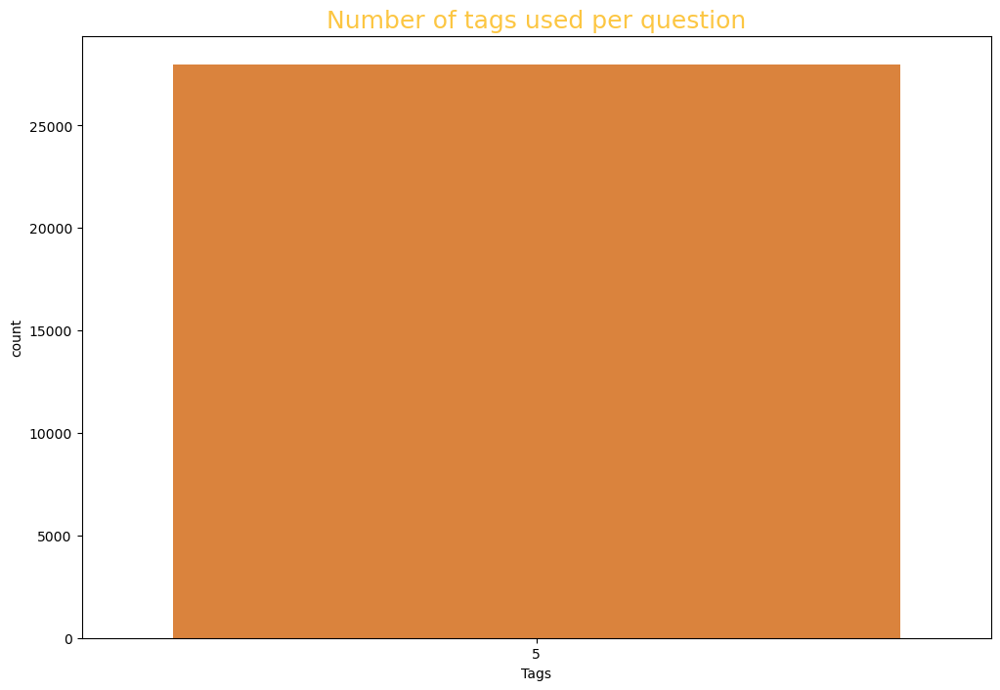

In [53]:
# Nombre de Tags par question :

# Create a list of Tags and count the number
data['Tags_list'] = data['Tags'].str.split(',')
data['Tags_count'] = data['Tags_list'].apply(lambda x: len(x))

# Plot the result
fig = plt.figure(figsize=(12, 8))
ax = sns.countplot(x=data.Tags_count, color="#f48023")
ax.set_xlabel("Tags")
plt.title("Number of tags used per question",
          fontsize=18, color="#fcc642")
plt.show()

Comme les algorithmes NLP sont assez lents, nous allons filtrer nos données. Nous allons prendre seulement les sujets qui sont dans les 50 meilleurs tags et supprimer le reste.

In [54]:
def filter_tag(x, top_list):
    """Comparison of the elements of 2 lists to 
    check if all the tags are found in a list of top tags.

    Parameters
    ----------------------------------------
    x : list
        List of tags to test.
    ----------------------------------------
    """
    temp_list = []
    for item in x:
        if (item in top_list):
            #x.remove(item)
            temp_list.append(item)
    return temp_list

In [55]:
top_tags = list(tags_list.iloc[0:50].index)
data['Tags_list'] = data['Tags_list']\
                    .apply(lambda x: filter_tag(x, top_tags))
data['number_of_tags'] = data['Tags_list'].apply(lambda x : len(x))
data = data[data.number_of_tags > 0]
print("New size of dataset : {} questions.".format(data.shape[0]))

New size of dataset : 24882 questions.


In [56]:
data.head(1)

,CreationDate,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount,Text,Text_lower,Text_BeautifulSoup,Text_regex,Text_remove_duplicate,Text_tokenized,Text_stopwords,Text_lemmatized,Cleaned_text,length_cleaned_text,body_tokens_count,Tags_list,Tags_count,number_of_tags
0,2008-07-31 21:42:52,How to convert Decimal to Double in C#?,"<p>I want to assign the decimal variable &quot;trans&quot; to the double variable &quot;this.Opacity&quot;.</p>\n<pre class=""lang-cs prettyprint-override""><code>decimal trans = trackBar1.Value / 5000;\nthis.Opacity = trans;\n</code></pre>\n<p>When I build the app it gives the following error:</p...","c#,floating-point,type-conversion,double,decimal",4,783,68560,60,14,"How to convert Decimal to Double in C#?<p>I want to assign the decimal variable &quot;trans&quot; to the double variable &quot;this.Opacity&quot;.</p>\n<pre class=""lang-cs prettyprint-override""><code>decimal trans = trackBar1.Value / 5000;\nthis.Opacity = trans;\n</code></pre>\n<p>When I build t...","how to convert decimal to double in c#?<p>i want to assign the decimal variable &quot;trans&quot; to the double variable &quot;this.opacity&quot;.</p>\n<pre class=""lang-cs prettyprint-override""><code>decimal trans = trackbar1.value / 5000;\nthis.opacity = trans;\n</code></pre>\n<p>when i build t...","how to convert decimal to double in c#? i want to assign the decimal variable ""trans"" to the double variable ""this.opacity"". decimal trans = trackbar1.value / 5000;\nthis.opacity = trans; when i build the app it gives the following error: cannot implicitly convert type decimal to double",how to convert decimal to double in c i want to assign the decimal variable trans to the double variable this opacity decimal trans value this opacity trans when i build the app it gives the following error cannot implicitly convert type decimal to double,how to convert decimal double in c i want assign the variable trans this opacity value when build app it gives following error cannot implicitly type,"[how, to, convert, decimal, double, in, c, i, want, assign, the, variable, trans, this, opacity, value, when, build, app, it, gives, following, error, can, not, implicitly, type]","[convert, decimal, double, c, want, assign, variable, trans, opacity, value, build, app, gives, following, error, implicitly, type]","[convert, decimal, double, c, want, assign, variable, trans, opacity, value, build, app, give, follow, error, implicitly, type]",convert decimal double want assign variable trans opacity value build app give follow error implicitly type,16,16,[c#],5,1


In [57]:
def tag_clean(text):
    text=text.replace('[','')
    text=text.replace(']','')
    return text

In [58]:
data['top_tags'] =data['Tags_list'].apply(lambda x:', '.join(x))

In [60]:
data['top_tags'] = data['top_tags'].apply(tag_clean)

In [62]:
data.head(10)

,CreationDate,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount,Text,Text_lower,Text_BeautifulSoup,Text_regex,Text_remove_duplicate,Text_tokenized,Text_stopwords,Text_lemmatized,Cleaned_text,length_cleaned_text,body_tokens_count,Tags_list,Tags_count,number_of_tags,top_tags
0,2008-07-31 21:42:52,How to convert Decimal to Double in C#?,"<p>I want to assign the decimal variable &quot;trans&quot; to the double variable &quot;this.Opacity&quot;.</p>\n<pre class=""lang-cs prettyprint-override""><code>decimal trans = trackBar1.Value / 5000;\nthis.Opacity = trans;\n</code></pre>\n<p>When I build the app it gives the following error:</p...","c#,floating-point,type-conversion,double,decimal",4,783,68560,60,14,"How to convert Decimal to Double in C#?<p>I want to assign the decimal variable &quot;trans&quot; to the double variable &quot;this.Opacity&quot;.</p>\n<pre class=""lang-cs prettyprint-override""><code>decimal trans = trackBar1.Value / 5000;\nthis.Opacity = trans;\n</code></pre>\n<p>When I build t...","how to convert decimal to double in c#?<p>i want to assign the decimal variable &quot;trans&quot; to the double variable &quot;this.opacity&quot;.</p>\n<pre class=""lang-cs prettyprint-override""><code>decimal trans = trackbar1.value / 5000;\nthis.opacity = trans;\n</code></pre>\n<p>when i build t...","how to convert decimal to double in c#? i want to assign the decimal variable ""trans"" to the double variable ""this.opacity"". decimal trans = trackbar1.value / 5000;\nthis.opacity = trans; when i build the app it gives the following error: cannot implicitly convert type decimal to double",how to convert decimal to double in c i want to assign the decimal variable trans to the double variable this opacity decimal trans value this opacity trans when i build the app it gives the following error cannot implicitly convert type decimal to double,how to convert decimal double in c i want assign the variable trans this opacity value when build app it gives following error cannot implicitly type,"[how, to, convert, decimal, double, in, c, i, want, assign, the, variable, trans, this, opacity, value, when, build, app, it, gives, following, error, can, not, implicitly, type]","[convert, decimal, double, c, want, assign, variable, trans, opacity, value, build, app, gives, following, error, implicitly, type]","[convert, decimal, double, c, want, assign, variable, trans, opacity, value, build, app, give, follow, error, implicitly, type]",convert decimal double want assign variable trans opacity value build app give follow error implicitly type,16,16,[c#],5,1,c#
1,2008-07-31 23:55:37,Calculate relative time in C#,"<p>Given a specific <code>DateTime</code> value, how do I display relative time, like:</p>\n<ul>\n<li><code>2 hours ago</code></li>\n<li><code>3 days ago</code></li>\n<li><code>a month ago</code></li>\n</ul>\n","c#,datetime,time,datediff,relative-time-span",11,1633,194441,552,41,"Calculate relative time in C#<p>Given a specific <code>DateTime</code> value, how do I display relative time, like:</p>\n<ul>\n<li><code>2 hours ago</code></li>\n<li><code>3 days ago</code></li>\n<li><code>a month ago</code></li>\n</ul>\n","calculate relative time in c#<p>given a specific <code>datetime</code> value, how do i display relative time, like:</p>\n<ul>\n<li><code>2 hours ago</code></li>\n<li><code>3 days ago</code></li>\n<li><code>a month ago</code></li>\n</ul>\n","calculate relative time in c# given a specific datetime value, how do i display relative time, like: 2 hours ago 3 days ago a month ago",calculate relative time in c given a specific datetime value how do i display relative time like hours ago days ago a month ago,calculate relative time in c given a specific datetime value how do i display like hours ago days month,"[calculate, relative, time, in, c, given, a, specific, datetime, value, how, do, i, display, like, hours, ago, days, month]","[calculate, relative, time, c, given, specific, datetime, value, display, like, hours, ag

In [64]:
data.shape

(24882, 24)

In [66]:
data = data.drop(['Id',
                  'Score',
                  'ViewCount',
                  'FavoriteCount',
                  'AnswerCount',
                  'Text_remove_duplicate',
                  'Text_lower',
                  'Text_BeautifulSoup',
                  'Text_regex',
                  'Text_tokenized',
                  'Text_stopwords',
                  'Text_lemmatized',
                  'Tags_list',
                  'Tags_count',
                  'length_cleaned_text'], 
                  axis=1)

In [67]:
# Export to CSV
data.to_csv("processed_data.csv")

### Wordcloud vizualisation

In [72]:
# Instantiate a new wordcloud.
wordcloud_precleaning = WordCloud(random_state = 8,
        normalize_plurals = False,
        width = 600, height= 300,
        max_words = 300,
        stopwords = [])

text_brut = ' '.join(data['Text'])
# Apply the wordcloud to the text.
wordcloud_precleaning.generate(text_brut)

In [73]:
# Instantiate a new wordcloud.
wordcloud_cleaned_text = WordCloud(random_state = 8,
        normalize_plurals = False,
        width = 600, height= 300,
        max_words = 300,
        stopwords = [])

text_cleaned = ' '.join(data['Cleaned_text'])
# Apply the wordcloud to the text.
wordcloud_cleaned_text.generate(text_cleaned)

(-0.5, 599.5, 299.5, -0.5)

<Figure size 640x480 with 0 Axes>

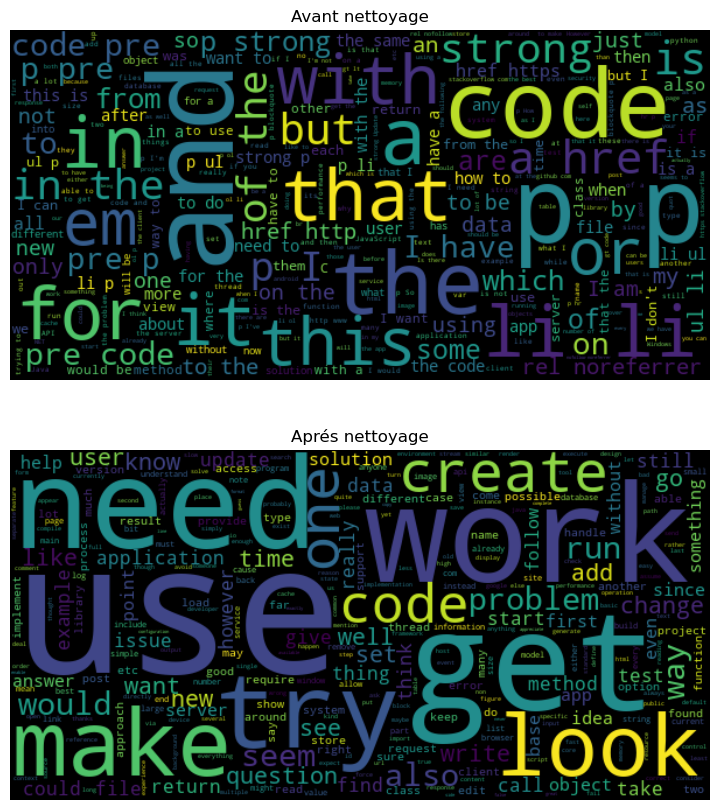

In [74]:
plt.figure()
fig, ax = plt.subplots(1,2, figsize = (20,10))

plt.subplot(211)
plt.imshow(wordcloud_precleaning, interpolation='bilinear')
plt.title("Avant nettoyage")
plt.axis("off")

plt.subplot(212)
plt.imshow(wordcloud_cleaned_text, interpolation='bilinear')
plt.title("Aprés nettoyage",)
plt.axis("off")

In [75]:
def tag_clean(text):
    text=text.replace('<','')
    text=text.replace('>',' ')
    
    return text

In [76]:
wordcloud_tag=WordCloud()
tags=' '.join(data['Tags'].apply(tag_clean))

wordcloud_tag.generate(tags)

(-0.5, 399.5, 199.5, -0.5)

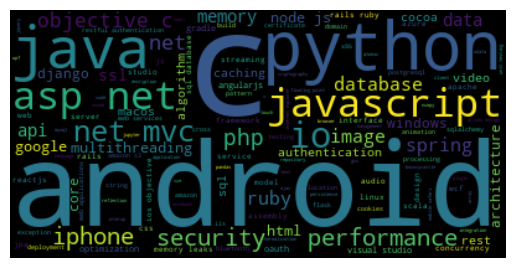

In [77]:
plt.imshow(wordcloud_tag, interpolation='bilinear')
plt.axis("off")

##  Vectorization <a class="anchor" id="chapter4"></a>

In [ ]:
data['Text_toVectorize'] = data['Cleaned_text'].apply(lambda x: ' '.join(x))

In [ ]:
data.head(2)

In [ ]:
vectorizer = CountVectorizer()

X = vectorizer.fit_transform(data['Text_toVectorize'])

X.todense()